In [1]:
import numpy as np, pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import VarianceThreshold
from lightgbm import LGBMClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
import statsmodels.api as sm
from tqdm import tqdm_notebook
from scipy.special import logit
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
train = pd.read_csv('data/train.csv')
test = pd.read_csv('data/test.csv')

cols = [c for c in train.columns if c not in ['id', 'target', 'wheezy-copper-turtle-magic']]

In [4]:
train2 = train[train['wheezy-copper-turtle-magic']==1]
train2.shape

(510, 258)

In [5]:
useful = train2[cols].columns[np.std(train2[cols])>1.5]
useless = train2[cols].columns[np.std(train2[cols])<1.5]

In [6]:
train0 = train2[ train['target']==0 ].copy()
train1 = train2[ train['target']==1 ].copy()

# useful plot

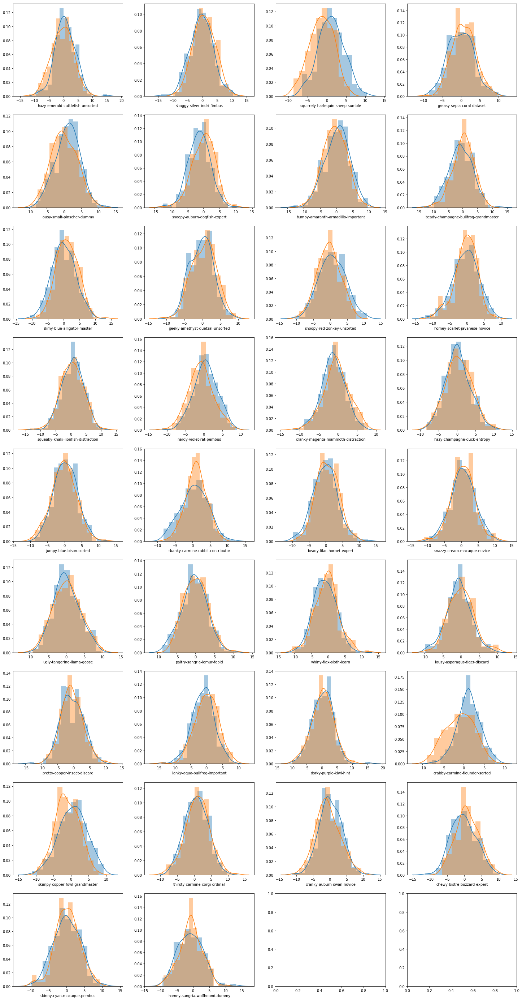

In [7]:
fig, ax = plt.subplots(int(np.ceil(len(useful)/4)),4,figsize=(25,50))
i = 0
for var in useful:
    
    i +=1
    plt.subplot(int(np.ceil(len(useful)/4)),4,i)

    sns.distplot(train0[var], label = 't=0')
    sns.distplot(train1[var], label = 't=1')

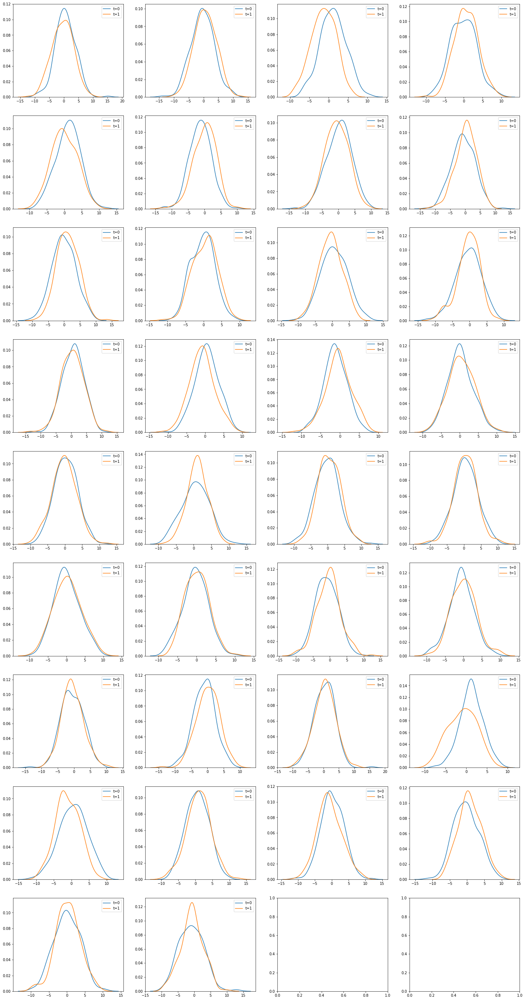

In [8]:
fig, ax = plt.subplots(int(np.ceil(len(useful)/4)),4,figsize=(25,50))
i = 0
for var in useful:
    
    i +=1
    plt.subplot(int(np.ceil(len(useful)/4)),4,i)

    sns.kdeplot(train0[var], label = 't=0')
    sns.kdeplot(train1[var], label = 't=1')

# useless plot

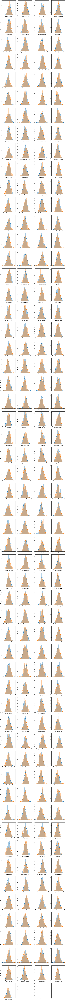

In [9]:
fig, ax = plt.subplots(int(np.ceil(len(useless)/4)),4,figsize=(25,400))
i = 0
for var in useless:
    
    i +=1
    plt.subplot(int(np.ceil(len(useless)/4)),4,i)

    sns.distplot(train0[var], label = 't=0')
    sns.distplot(train1[var], label = 't=1')

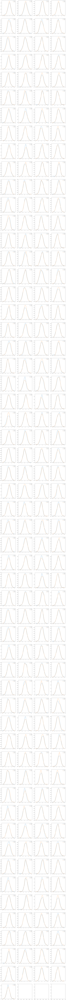

In [11]:
fig, ax = plt.subplots(int(np.ceil(len(useless)/4)),4,figsize=(25,400))
i = 0
for var in useless:
    
    i +=1
    plt.subplot(int(np.ceil(len(useless)/4)),4,i)

    sns.kdeplot(train0[var], label = 't=0')
    sns.kdeplot(train1[var], label = 't=1')

In [12]:
train3 = train2[ train['target']==0 ].copy()
train4 = train2[ train['target']==1 ].copy()
train3 = np.round(train3,2)
train4 = np.round(train4,2)

# 반올림후 useful plot

반올림전과 크게 변화가없다

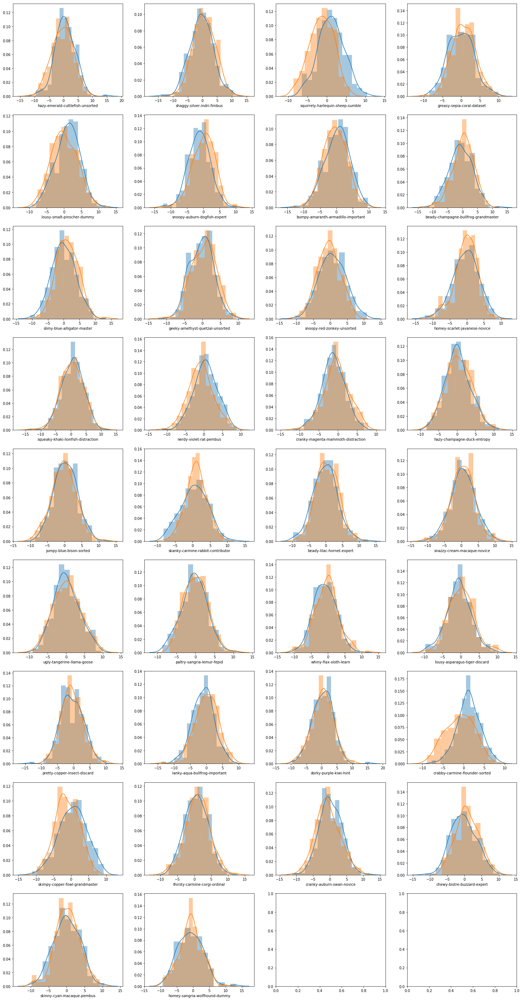

In [13]:
fig, ax = plt.subplots(int(np.ceil(len(useful)/4)),4,figsize=(25,50))
i = 0
for var in useful:
    
    i +=1
    plt.subplot(int(np.ceil(len(useful)/4)),4,i)

    sns.distplot(train3[var], label = 't=0')
    sns.distplot(train4[var], label = 't=1')